In [1]:
import osmnx as ox
%matplotlib inline
ox.config(log_console=True, use_cache=True)
import matplotlib.pyplot as plt
ox.__version__

'0.14.0'

In [2]:
address = "Beach Rd, Redhead NSW 2290, Australia"

graph = ox.graph_from_address(address,network_type='drive',dist=20000)

nodes, streets = ox.graph_to_gdfs(graph)

display(streets)

,u,v,key,osmid,highway,name,maxspeed,oneway,length,geometry,lanes,ref,bridge,junction,width,access,est_width,tunnel
0,4812701696,4812701699,0,488979392,residential,Callemonda Close,50,False,89.588,"LINESTRING (151.68153 -33.01304, 151.68144 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5048434690,5048434681,0,517806627,residential,Silkstone Circuit,NaN,False,63.140,"LINESTRING (151.62861 -33.16237, 151.62929 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5048434690,5048434647,0,517806627,residential,Silkstone Circuit,NaN,False,136.564,"LINESTRING (151.62861 -33.16237, 151.62715 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5048434690,5048434648,0,517322306,residential,Quinn Street,NaN,False,171.749,"LINESTRING (151.62861 -33.16237, 151.62860 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4812701699,1844333226,0,172707768,tertiary,Dalrymple Street,50,False,91.022,"LINESTRING (151.68130 -33.01380, 151.68228 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29612,4812701692,1835850290,0,232850770,residential,Agden Close,50,False,41.986,"LINESTRING (151.65630 -33.02289, 151.65613 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29613,4812701693,4812701695,0,488979391,residential,Genoa Close,50,False,108.404,"LINESTRING (151.64886 -33.02022, 151.64888 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29614,4812701695,1835871504,0,172710229,residential,Spinnaker Ridge Way,50,False,25.036,"LINESTRING (151.64914 -33.02115, 151.64928 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29615,4812701695,1835859535,0,172710229,residential,Spinnaker Ridge Way,50,False,167.477,"LINESTRING (151.64914 -33.02115, 151.64888 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


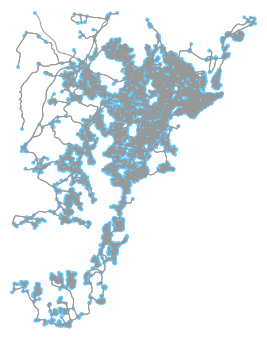

<Figure size 432x288 with 0 Axes>

In [3]:
fig, ax = ox.plot_graph(graph)

plt.tight_layout()

In [4]:
def get_road_type(street_name):
    if isinstance(street_name,list):
        street_name = street_name[0]
    return street_name.split()[-1]

streets = streets[streets['name'].notna()]

streets['street_type'] = streets['name'].dropna().apply(get_road_type)

display(streets)

,u,v,key,osmid,highway,name,maxspeed,oneway,length,geometry,lanes,ref,bridge,junction,width,access,est_width,tunnel,street_type
0,4812701696,4812701699,0,488979392,residential,Callemonda Close,50,False,89.588,"LINESTRING (151.68153 -33.01304, 151.68144 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Close
1,5048434690,5048434681,0,517806627,residential,Silkstone Circuit,NaN,False,63.140,"LINESTRING (151.62861 -33.16237, 151.62929 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Circuit
2,5048434690,5048434647,0,517806627,residential,Silkstone Circuit,NaN,False,136.564,"LINESTRING (151.62861 -33.16237, 151.62715 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Circuit
3,5048434690,5048434648,0,517322306,residential,Quinn Street,NaN,False,171.749,"LINESTRING (151.62861 -33.16237, 151.62860 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Street
4,4812701699,1844333226,0,172707768,tertiary,Dalrymple Street,50,False,91.022,"LINESTRING (151.68130 -33.01380, 151.68228 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Street
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29612,4812701692,1835850290,0,232850770,residential,Agden Close,50,False,41.986,"LINESTRING (151.65630 -33.02289, 151.65613 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Close
29613,4812701693,4812701695,0,488979391,residential,Genoa Close,50,False,108.404,"LINESTRING (151.64886 -33.02022, 151.64888 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Close
29614,4812701695,1835871504,0,172710229,residential,Spinnaker Ridge Way,50,False,25.036,"LINESTRING (151.64914 -33.02115, 151.64928 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Way
29615,4812701695,1835859535,0,172710229,residential,Spinnaker Ridge Way,50,False,167.477,"LINESTRING (151.64914 -33.02115, 151.64888 -33...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Way


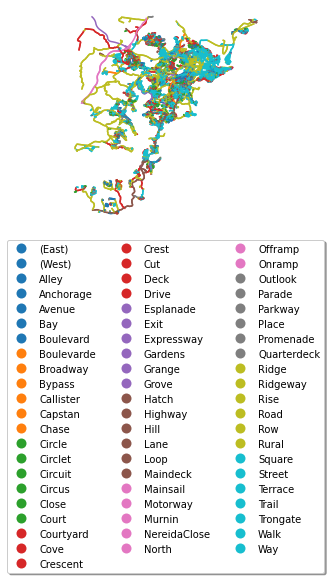

In [5]:
ax = streets.plot(column='street_type',legend=True,legend_kwds={'bbox_to_anchor':(0.5,-0.05),'shadow':True,'ncol':3,'loc':'upper center'})
ax.axis('off')
fig = ax.get_figure()
fig.savefig('figure.pdf',bbox_inches='tight')

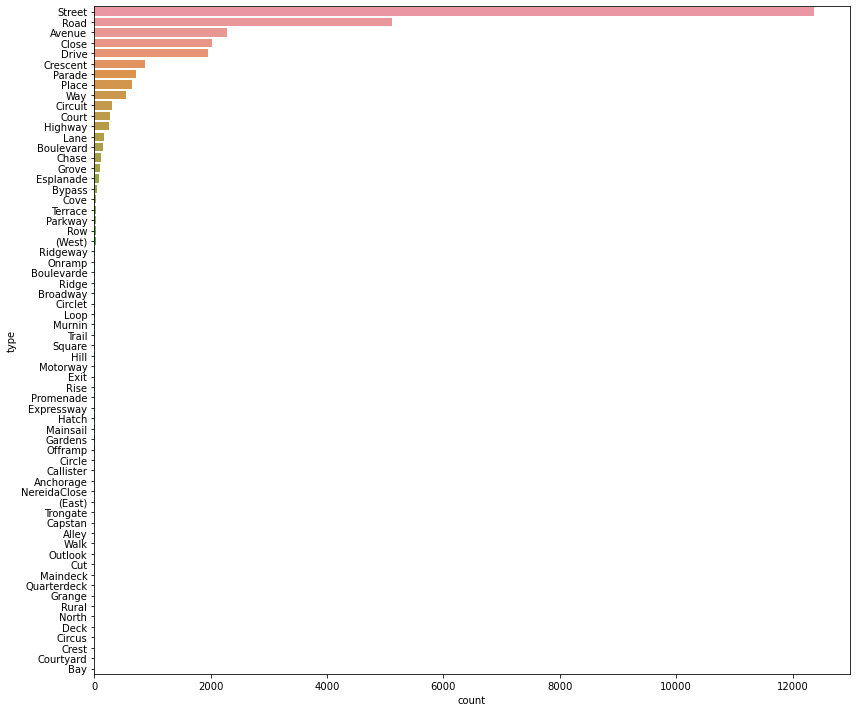

In [6]:
import pandas as pd
import seaborn as sns
street_types = pd.DataFrame(streets["street_type"].apply(pd.Series)[0].value_counts().reset_index())
street_types.columns = ["type", "count"]
fig, ax = plt.subplots(figsize=(12,10))
sns.barplot(y="type", x="count", data=street_types, ax=ax)
plt.tight_layout()
plt.savefig("barchart.png")